In [2]:
import os
import time
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import optuna

import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
seed_val = 42
np.random.seed(seed_val)
torch.manual_seed(seed_val)
os.environ["CC"] = "/usr/bin/gcc"
torch.set_float32_matmul_precision('high')
optuna.logging.set_verbosity(optuna.logging.INFO)


In [3]:
train_df = pd.read_csv('../../../data/train_resample_minmax_all.csv')
test_df = pd.read_csv('../../../data/test_resample_minmax_all.csv')
print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)
print(f"Total aggregate rows: {train_df.shape[0] + test_df.shape[0]}")

# Préparation des données d'entraînement
data_id_train = train_df["apogee_id"]
data_target_train = train_df[["TEFF", "LOGG", "J", "H", "K"]]
train_features = train_df.drop(columns=["apogee_id", "TEFF", "LOGG", "J", "H", "K"]).astype('float32')

# Préparation des données de test
data_id_test = test_df["apogee_id"]
data_target_test = test_df[["TEFF", "LOGG", "J", "H", "K"]]
test_features = test_df.drop(columns=["apogee_id", "TEFF", "LOGG", "J", "H", "K"]).astype('float32')

# Conversion en tenseurs PyTorch
X_train = torch.tensor(train_features.values, dtype=torch.float32)
y_teff_train = torch.tensor(data_target_train["TEFF"].values, dtype=torch.float32)
y_logg_train = torch.tensor(data_target_train["LOGG"].values, dtype=torch.float32)

X_test = torch.tensor(test_features.values, dtype=torch.float32)
y_teff_test = torch.tensor(data_target_test["TEFF"].values, dtype=torch.float32)
y_logg_test = torch.tensor(data_target_test["LOGG"].values, dtype=torch.float32)

# Création d'un tenseur global et d'une liste d'identifiants pour le plot final
X_full_tensor = torch.cat([X_train, X_test], dim=0)
data_id_full = pd.concat([data_id_train, data_id_test], ignore_index=True)

print("X_train shape:", X_train.shape)
print("y_teff_train shape:", y_teff_train.shape)
print("y_logg_train shape:", y_logg_train.shape)
print("X_test shape:", X_test.shape)
print("y_teff_test shape:", y_teff_test.shape)
print(f"Train size: {len(X_train)} - Test size: {len(X_test)}")

Train shape: (129124, 23)
Test shape: (32282, 23)
Total aggregate rows: 161406
X_train shape: torch.Size([129124, 17])
y_teff_train shape: torch.Size([129124])
y_logg_train shape: torch.Size([129124])
X_test shape: torch.Size([32282, 17])
y_teff_test shape: torch.Size([32282])
Train size: 129124 - Test size: 32282


In [4]:
class StarDataset(Dataset):
    """
    A simple PyTorch Dataset that returns X -> TEFF, LOGG in a multi-task setup.
    """
    def __init__(self, X, y_teff, y_logg):
        super().__init__()
        self.X = X
        self.y_teff = y_teff
        self.y_logg = y_logg
        self.n = X.shape[0]

    def __len__(self):
        return self.n

    def __getitem__(self, idx):
        x_i = self.X[idx]
        teff_i = self.y_teff[idx]
        logg_i = self.y_logg[idx]
        return x_i, teff_i, logg_i

train_dataset = StarDataset(X_train, y_teff_train, y_logg_train)
test_dataset  = StarDataset(X_test,  y_teff_test,  y_logg_test)

train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)
val_loader  = DataLoader(test_dataset,  batch_size=512, shuffle=False)

In [5]:
class TempLoggRegressor(nn.Module):
    """
    Multi-task regressor for TEFF and LOGG with tunable hidden dimensions.
    """
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, embed_dim, negative_slope):
        super(TempLoggRegressor, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim1)
        self.bn1 = nn.BatchNorm1d(hidden_dim1)
        self.fc2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.bn2 = nn.BatchNorm1d(hidden_dim2)
        self.embedding = nn.Linear(hidden_dim2, embed_dim)
        self.regressor = nn.Linear(embed_dim, 2)
        self.negative_slope = negative_slope

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = F.leaky_relu(x, negative_slope=self.negative_slope)
        x = self.fc2(x)
        x = self.bn2(x)
        x = F.leaky_relu(x, negative_slope=self.negative_slope)
        z = self.embedding(x)
        out = self.regressor(z)
        return z, out

In [6]:
def objective_regressor(trial):
    # --- Hyperparamètres à tuner ---
    hidden_dim1 = trial.suggest_int("hidden_dim1", 16, 128, step=16)
    hidden_dim2 = trial.suggest_int("hidden_dim2", 16, 128, step=16)
    embed_dim = trial.suggest_categorical("embed_dim", [2])
    negative_slope = trial.suggest_float("negative_slope", 1e-3, 1e-1, log=True)
    lr = trial.suggest_float("lr", 1e-5, 1e-2, log=True)

    # --- Création du modèle ---
    input_dim = X_train.shape[1]  # Assurez-vous que X_train_cpu est défini (features sur CPU)
    model = TempLoggRegressor(input_dim=input_dim, hidden_dim1=hidden_dim1,
                              hidden_dim2=hidden_dim2, embed_dim=embed_dim,
                              negative_slope=negative_slope).cuda()
    # Optionnel : compilation du modèle
    model = torch.compile(model, mode="reduce-overhead")

    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    # Paramètres d'entraînement pour le tuning
    num_epochs = 100
    patience = 10
    best_train_loss = float("inf")
    epochs_no_improve = 0

    # Boucle d'entraînement
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        total_samples = 0

        for batch in train_loader:
            # Supposons que le DataLoader renvoie : (x, teff, logg)
            x, teff, logg = batch
            x = x.to(device)
            teff = teff.to(device).unsqueeze(1)  # [bs, 1]
            logg = logg.to(device).unsqueeze(1)  # [bs, 1]
            optimizer.zero_grad()
            _, out = model(x)  # out: [bs, 2]
            y_true = torch.cat([teff, logg], dim=1)  # [bs, 2]
            loss = criterion(out, y_true)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * x.size(0)
            total_samples += x.size(0)
        train_loss = running_loss / total_samples if total_samples > 0 else float("inf")

        trial.report(train_loss, epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

        if train_loss < best_train_loss:
            best_train_loss = train_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                break

    return best_train_loss

def run_hyperparameter_search_regressor(n_trials=20):
    study = optuna.create_study(direction="minimize")
    study.optimize(objective_regressor, n_trials=n_trials, show_progress_bar=True)

    print("Number of finished trials:", len(study.trials))
    print("Best trial:")
    best_trial = study.best_trial
    print(f"  Value (lowest train loss): {best_trial.value}")
    print("  Params:")
    for key, value in best_trial.params.items():
        print(f"    {key}: {value}")
    return study

# --- Exécuter la recherche d'hyperparamètres pour TempLoggRegressor ---
study_regressor = run_hyperparameter_search_regressor(n_trials=10)

[I 2025-03-29 10:40:05,361] A new study created in memory with name: no-name-e7deda48-95b7-445c-baff-1bcee67fa4a9


  0%|          | 0/10 [00:00<?, ?it/s]

W0329 10:40:14.167000 107312 site-packages/torch/_inductor/utils.py:1137] [0/0] Not enough SMs to use max_autotune_gemm mode


[I 2025-03-29 10:42:12,671] Trial 0 finished with value: 0.0023463031745577993 and parameters: {'hidden_dim1': 64, 'hidden_dim2': 80, 'embed_dim': 2, 'negative_slope': 0.058997880060604385, 'lr': 0.00021258253965305781}. Best is trial 0 with value: 0.0023463031745577993.


skipping cudagraphs due to skipping cudagraphs due to cpu device (primals_10)


[I 2025-03-29 10:44:41,116] Trial 1 finished with value: 0.0031867367435800173 and parameters: {'hidden_dim1': 96, 'hidden_dim2': 128, 'embed_dim': 2, 'negative_slope': 0.004017703486625478, 'lr': 2.230587398051486e-05}. Best is trial 0 with value: 0.0023463031745577993.


skipping cudagraphs due to skipping cudagraphs due to cpu device (primals_10)


[W 2025-03-29 10:46:52,402] Trial 2 failed with parameters: {'hidden_dim1': 80, 'hidden_dim2': 112, 'embed_dim': 2, 'negative_slope': 0.0018998944477497458, 'lr': 0.0009593709946410054} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/home/maxime/miniforge3/envs/rapids-25.02/lib/python3.12/site-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/tmp/ipykernel_107312/4281439371.py", line 32, in objective_regressor
    for batch in train_loader:
                 ^^^^^^^^^^^^
  File "/home/maxime/miniforge3/envs/rapids-25.02/lib/python3.12/site-packages/torch/utils/data/dataloader.py", line 708, in __next__
    data = self._next_data()
           ^^^^^^^^^^^^^^^^^
  File "/home/maxime/miniforge3/envs/rapids-25.02/lib/python3.12/site-packages/torch/utils/data/dataloader.py", line 764, in _next_data
    data = self._dataset_fetcher.fetch(index)  # may raise S

KeyboardInterrupt: 

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

output_folder = "output_dataset"
os.makedirs(output_folder, exist_ok=True)
weight_folder = "output_weight"
os.makedirs(weight_folder, exist_ok=True)

# Paramètres fixes (vous pouvez les adapter ou les tuner séparément)
hidden_dim1 = 128
hidden_dim2 = 128
negative_slope = 0.06319900642834919
learning_rate = 0.0008681928553080545
n_epochs = 500
patience = 1000
criterion = nn.MSELoss()

for embed_dim in [2, 3, 4]:
    print(f"\nTraining TempLoggRegressor with embedding dimension: {embed_dim}")

    input_dim = X_train.shape[1]
    model = TempLoggRegressor(input_dim=input_dim, hidden_dim1=hidden_dim1,
                               hidden_dim2=hidden_dim2, embed_dim=embed_dim,
                               negative_slope=negative_slope).to(device)
    # Optionnel : compilation du modèle
    model = torch.compile(model, mode="reduce-overhead")

    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    best_val_loss = float('inf')
    epochs_no_improve = 0

    # Boucle d'entraînement
    for epoch in range(n_epochs):
        model.train()
        running_loss = 0.0
        total_samples = 0

        # Training loop
        for batch in train_loader:
            x_batch, teff_batch, logg_batch = batch
            x_batch = x_batch.to(device)
            teff_batch = teff_batch.to(device).unsqueeze(1)  # [bs, 1]
            logg_batch = logg_batch.to(device).unsqueeze(1)    # [bs, 1]
            optimizer.zero_grad()
            _, out = model(x_batch)  # out: [bs, 2]
            y_true = torch.cat([teff_batch, logg_batch], dim=1)  # [bs, 2]
            loss = criterion(out, y_true)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * x_batch.size(0)
            total_samples += x_batch.size(0)
        train_loss = running_loss / total_samples if total_samples > 0 else float("inf")

        # Validation loop
        model.eval()
        running_val_loss = 0.0
        total_val_samples = 0
        with torch.no_grad():
            for batch in val_loader:
                x_batch, teff_batch, logg_batch = batch
                x_batch = x_batch.to(device)
                teff_batch = teff_batch.to(device).unsqueeze(1)
                logg_batch = logg_batch.to(device).unsqueeze(1)
                _, out = model(x_batch)
                y_true = torch.cat([teff_batch, logg_batch], dim=1)
                loss = criterion(out, y_true)
                running_val_loss += loss.item() * x_batch.size(0)
                total_val_samples += x_batch.size(0)
        val_loss = running_val_loss / total_val_samples if total_val_samples > 0 else float("inf")

        print(f"Epoch [{epoch+1}/{n_epochs}]  Train Loss: {train_loss:.6f}  |  Val Loss: {val_loss:.6f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            model_file = os.path.join(weight_folder, f"best_tempLoggRegressor_{embed_dim}D.pth")
            torch.save(model.state_dict(), model_file)
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stop!")
                break

    # Charger le meilleur modèle
    model_file = os.path.join(weight_folder, f"best_tempLoggRegressor_{embed_dim}D.pth")
    model.load_state_dict(torch.load(model_file, map_location=device))
    model.eval()

    with torch.no_grad():
        full_tensor_device = X_full_tensor.to(device)
        # Utiliser model(full_tensor_device) pour obtenir le tuple (z, out)
        z_all, _ = model(full_tensor_device)  # z_all: [N, d]
    latent_embeddings = z_all.cpu().numpy()  # Retour sur CPU

    # Créer un DataFrame pour les embeddings et ajouter la colonne apogee_id
    df_embedding = pd.DataFrame(latent_embeddings, columns=[f"latent_{i+1}" for i in range(embed_dim)])
    df_embedding.insert(0, "apogee_id", data_id_full.values)

    output_file = os.path.join(output_folder, f"tempLoggRegressor_latent_space_{embed_dim}D.csv")
    df_embedding.to_csv(output_file, index=False)
    print(f"Saved {embed_dim}D embeddings to: {output_file}")

Using device: cuda

Training TempLoggRegressor with embedding dimension: 2


skipping cudagraphs due to skipping cudagraphs due to cpu device (primals_10)
skipping cudagraphs due to skipping cudagraphs due to cpu device (arg8_1)


Epoch [1/500]  Train Loss: 0.020808  |  Val Loss: 0.005399
Epoch [2/500]  Train Loss: 0.004739  |  Val Loss: 0.004562
Epoch [3/500]  Train Loss: 0.004156  |  Val Loss: 0.004242
Epoch [4/500]  Train Loss: 0.003815  |  Val Loss: 0.004320
Epoch [5/500]  Train Loss: 0.003618  |  Val Loss: 0.003754
Epoch [6/500]  Train Loss: 0.003422  |  Val Loss: 0.003705
Epoch [7/500]  Train Loss: 0.003308  |  Val Loss: 0.003492
Epoch [8/500]  Train Loss: 0.003190  |  Val Loss: 0.003129
Epoch [9/500]  Train Loss: 0.003124  |  Val Loss: 0.003083
Epoch [10/500]  Train Loss: 0.003029  |  Val Loss: 0.003946
Epoch [11/500]  Train Loss: 0.002956  |  Val Loss: 0.003062
Epoch [12/500]  Train Loss: 0.002914  |  Val Loss: 0.003047
Epoch [13/500]  Train Loss: 0.002850  |  Val Loss: 0.002894
Epoch [14/500]  Train Loss: 0.002799  |  Val Loss: 0.002853
Epoch [15/500]  Train Loss: 0.002788  |  Val Loss: 0.002842
Epoch [16/500]  Train Loss: 0.002754  |  Val Loss: 0.003128
Epoch [17/500]  Train Loss: 0.002689  |  Val Loss

skipping cudagraphs due to skipping cudagraphs due to cpu device (primals_10)
skipping cudagraphs due to skipping cudagraphs due to cpu device (arg8_1)


Epoch [1/500]  Train Loss: 0.006982  |  Val Loss: 0.004481
Epoch [2/500]  Train Loss: 0.004016  |  Val Loss: 0.003721
Epoch [3/500]  Train Loss: 0.003502  |  Val Loss: 0.003783
Epoch [4/500]  Train Loss: 0.003230  |  Val Loss: 0.003262
Epoch [5/500]  Train Loss: 0.003077  |  Val Loss: 0.003172
Epoch [6/500]  Train Loss: 0.002909  |  Val Loss: 0.002814
Epoch [7/500]  Train Loss: 0.002815  |  Val Loss: 0.005300
Epoch [8/500]  Train Loss: 0.002770  |  Val Loss: 0.002862
Epoch [9/500]  Train Loss: 0.002697  |  Val Loss: 0.003126
Epoch [10/500]  Train Loss: 0.002615  |  Val Loss: 0.002698
Epoch [11/500]  Train Loss: 0.002584  |  Val Loss: 0.003600
Epoch [12/500]  Train Loss: 0.002536  |  Val Loss: 0.002500
Epoch [13/500]  Train Loss: 0.002497  |  Val Loss: 0.002757
Epoch [14/500]  Train Loss: 0.002458  |  Val Loss: 0.002556
Epoch [15/500]  Train Loss: 0.002410  |  Val Loss: 0.002809
Epoch [16/500]  Train Loss: 0.002420  |  Val Loss: 0.002640
Epoch [17/500]  Train Loss: 0.002369  |  Val Loss

W0329 11:12:53.345000 107312 site-packages/torch/_dynamo/convert_frame.py:906] [0/8] torch._dynamo hit config.cache_size_limit (8)
W0329 11:12:53.345000 107312 site-packages/torch/_dynamo/convert_frame.py:906] [0/8]    function: 'forward' (/tmp/ipykernel_107312/2638467996.py:15)
W0329 11:12:53.345000 107312 site-packages/torch/_dynamo/convert_frame.py:906] [0/8]    last reason: 0/0: tensor 'L['self']._modules['fc1']._parameters['weight']' size mismatch at index 0. expected 64, actual 128. Guard failed on a parameter, consider using torch._dynamo.config.force_parameter_static_shapes = False to allow dynamism on parameters.
W0329 11:12:53.345000 107312 site-packages/torch/_dynamo/convert_frame.py:906] [0/8] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0329 11:12:53.345000 107312 site-packages/torch/_dynamo/convert_frame.py:906] [0/8] To diagnose recompilation issues, see https://pytorch.org/docs/main/torch.compiler_troubleshooting.html.


Saved 3D embeddings to: output_dataset/tempLoggRegressor_latent_space_3D.csv

Training TempLoggRegressor with embedding dimension: 4
Epoch [1/500]  Train Loss: 0.007110  |  Val Loss: 0.004373
Epoch [2/500]  Train Loss: 0.004083  |  Val Loss: 0.004320
Epoch [3/500]  Train Loss: 0.003655  |  Val Loss: 0.003999
Epoch [4/500]  Train Loss: 0.003367  |  Val Loss: 0.003709
Epoch [5/500]  Train Loss: 0.003186  |  Val Loss: 0.003116
Epoch [6/500]  Train Loss: 0.003028  |  Val Loss: 0.004350
Epoch [7/500]  Train Loss: 0.002920  |  Val Loss: 0.003162
Epoch [8/500]  Train Loss: 0.002817  |  Val Loss: 0.002785
Epoch [9/500]  Train Loss: 0.002761  |  Val Loss: 0.003104
Epoch [10/500]  Train Loss: 0.002691  |  Val Loss: 0.003570
Epoch [11/500]  Train Loss: 0.002642  |  Val Loss: 0.003026
Epoch [12/500]  Train Loss: 0.002609  |  Val Loss: 0.003279
Epoch [13/500]  Train Loss: 0.002538  |  Val Loss: 0.002640
Epoch [14/500]  Train Loss: 0.002511  |  Val Loss: 0.002729
Epoch [15/500]  Train Loss: 0.002492

In [8]:
model.eval()
test_loss = 0.0
with torch.no_grad():
    for batch in val_loader:
        x_i, teff_i, logg_i = batch
        x_i = x_i.to(device)
        teff_i = teff_i.to(device).unsqueeze(1)
        logg_i = logg_i.to(device).unsqueeze(1)

        z, out = model(x_i)
        y_true = torch.cat([teff_i, logg_i], dim=1)
        loss = criterion(out, y_true)
        test_loss += loss.item()

test_loss /= len(val_loader)
print(f"\nTest Loss = {test_loss:.4f}")


Test Loss = 0.0020


In [9]:
model.eval()
X_all = torch.cat((X_train, X_test), dim=0).to(device)

with torch.no_grad():
    Z_all, out_all = model(X_all)  # Z_all: [N, embed_dim], out_all: [N,2]

Z_all_cpu = Z_all.cpu().numpy()
pred_all  = out_all.cpu().numpy()

# We also gather the full TEFF, LOGG ground truth
teff_all = torch.cat((y_teff_train, y_teff_test), dim=0).numpy()
logg_all = torch.cat((y_logg_train, y_logg_test), dim=0).numpy()

print("\nEmbedding shape:", Z_all_cpu.shape, "(the penultimate layer)")


Embedding shape: (161406, 4) (the penultimate layer)


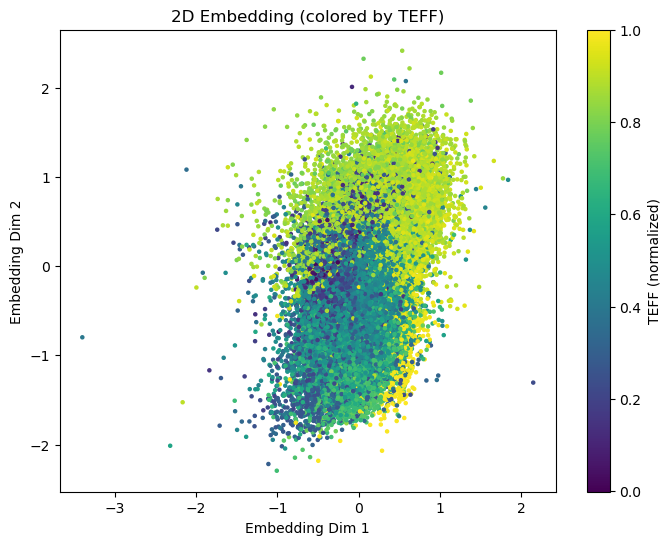

In [10]:
plt.figure(figsize=(8,6), dpi=100)
sc = plt.scatter(Z_all_cpu[:,0], Z_all_cpu[:,1], c=logg_all, s=5, cmap='viridis')
plt.colorbar(sc, label="TEFF (normalized)")
plt.xlabel("Embedding Dim 1")
plt.ylabel("Embedding Dim 2")
plt.title("2D Embedding (colored by TEFF)")
plt.show()

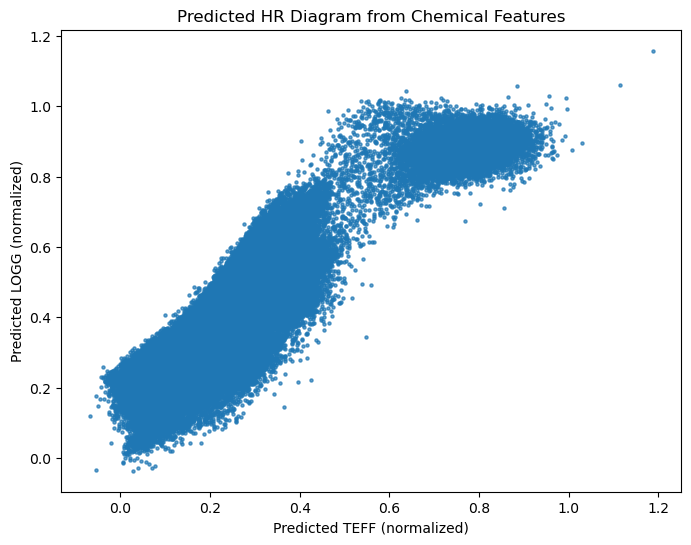

In [11]:
pred_teff = pred_all[:,0]
pred_logg = pred_all[:,1]

plt.figure(figsize=(8,6), dpi=100)
plt.scatter(pred_teff, pred_logg, s=5, alpha=0.7)
plt.xlabel("Predicted TEFF (normalized)")
plt.ylabel("Predicted LOGG (normalized)")
plt.title("Predicted HR Diagram from Chemical Features")
plt.show()

In [12]:
# ###############################################################################
# T-SNE PROJECTION OF THE EMBEDDING (FOR BETTER VISUAL CLARITY)
###############################################################################
import cupy as cp
import cudf
from cuml.manifold import TSNE

# Convert the embedding Z_all_cpu (numpy) to cupy for cuML
Z_all_cupy = cp.asarray(Z_all_cpu)

# Apply t-SNE to get a 2D projection (often helps with local structure)
tsne = TSNE(n_components=2, perplexity=70, n_iter=1000, verbose=True)
Z_tsne_cupy = tsne.fit_transform(Z_all_cupy)  # shape [N, 2]

# Convert to cuDF then to pandas for plotting with matplotlib
Z_tsne_cudf = cudf.DataFrame(Z_tsne_cupy, columns=["tsne1", "tsne2"])
Z_tsne_df = Z_tsne_cudf.to_pandas()



/home/maxime/miniforge3/envs/rapids-25.02/lib/python3.12/site-packages/cuml/internals/api_decorators.py:400: UserWarning: Starting from version 22.04, the default method of TSNE is 'fft'.
  return init_func(self, *args, **filtered_kwargs)


[2025-03-29 11:33:18.025] [CUML] [debug] Data size = (161406, 4) with dim = 2 perplexity = 70.000000
[2025-03-29 11:33:18.026] [CUML] [warning] Perplexity should be within ranges (5, 50). Your results might be a bit strange...
[2025-03-29 11:33:18.026] [CUML] [warning] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
[2025-03-29 11:33:18.076] [CUML] [debug] Getting distances.
[2025-03-29 11:33:20.896] [CUML] [debug] Now normalizing distances so exp(D) doesn't explode.
[2025-03-29 11:33:20.898] [CUML] [debug] Searching for optimal perplexity via bisection search.
[2025-03-29 11:33:25.567] [CUML] [debug] [t-SNE] KL divergence: -0.15075372159481049


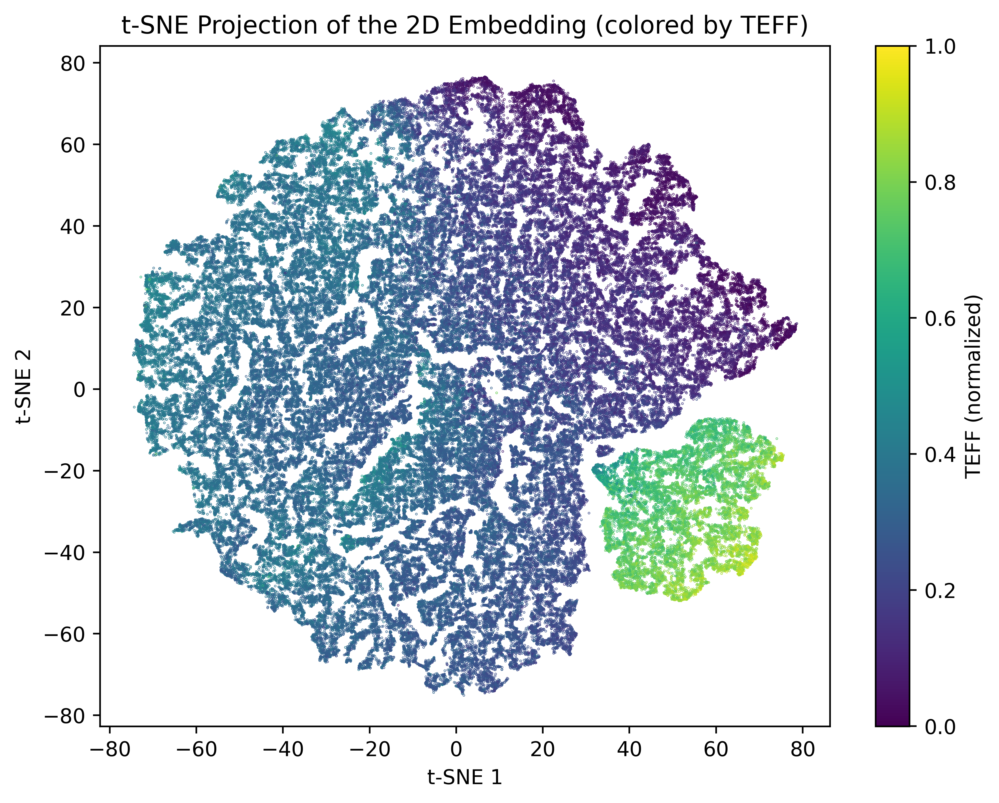

In [13]:

# Plot the t-SNE result
plt.figure(figsize=(8,6), dpi=500)
sc = plt.scatter(
    Z_tsne_df["tsne1"],
    Z_tsne_df["tsne2"],
    c=teff_all,      # color by TEFF if you like
    s=0.05,
    cmap='viridis'
)
plt.colorbar(sc, label="TEFF (normalized)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("t-SNE Projection of the 2D Embedding (colored by TEFF)")
plt.show()

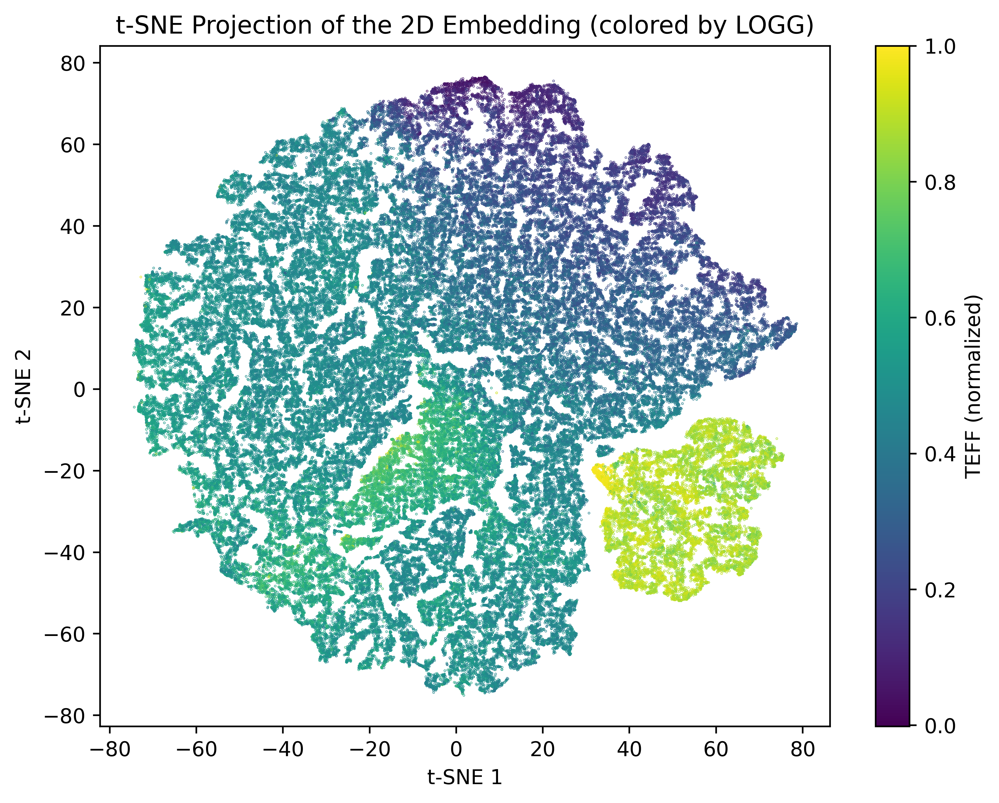

In [14]:

# Plot the t-SNE result
plt.figure(figsize=(8,6), dpi=500)
sc = plt.scatter(
    Z_tsne_df["tsne1"],
    Z_tsne_df["tsne2"],
    c=logg_all,      # color by TEFF if you like
    s=0.05,
    cmap='viridis'
)
plt.colorbar(sc, label="TEFF (normalized)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("t-SNE Projection of the 2D Embedding (colored by LOGG)")
plt.show()